In [7]:
import sys, os
import tensorflow as tf
sys.path.append("..")
import tools
import evals
import matplotlib.pyplot as plt
import matplotlib as mpl
from astroML.crossmatch import crossmatch_angular
import numpy as np
from lsst.daf.butler import Butler
import pandas as pd
import multiprocessing
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
tf_dataset_path = "/astro/users/kmrakovc/Projects/LSST_Streak_Detection/DATA/test1.tfrecord"
model_path = "../DATA/Model_test_5.keras"
threshold = 0.5
predictions = evals.eval_tools.create_NN_prediction (tf_dataset_path, model_path, threshold=threshold)

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensor

AttributeError: module 'evals.eval_tools' has no attribute 'create_XY_pairs'

In [3]:
inputs, truths = tools.data.create_XY_pairs (tf_dataset_path)

In [4]:
tp,fp,fn, mask = evals.eval_tools.get_one_image_mask (truths[0], predictions[0])
print (evals.eval_tools.f1_score (tp,fp,fn), evals.eval_tools.precision (tp,fp,fn), evals.eval_tools.recall(tp,fp,fn))

0.5161290322580645 0.7272727272727273 0.4


In [8]:
def plot_mask_on_axis (mask, ax):
    cmap = mpl.colors.ListedColormap(['white', 'green', 'cyan', 'red'])
    ax.imshow(mask, cmap=cmap, interpolation='nearest')
    ax.set_xticks([])
    ax.set_yticks([])
    labels = {0:'True Negative', 1:'True Positive', 2:'False Positive', 3:"False Negative"}    
    patches =[mpl.patches.Patch(color=cmap.colors[i],label=labels[i]) for i in range(len(cmap.colors))]
    ax.legend(handles=patches)
    return ax

def plot_input_on_axis (img, ax):
    ax.imshow(img, cmap="grey")
    ax.set_xticks([])
    ax.set_yticks([])
    return ax

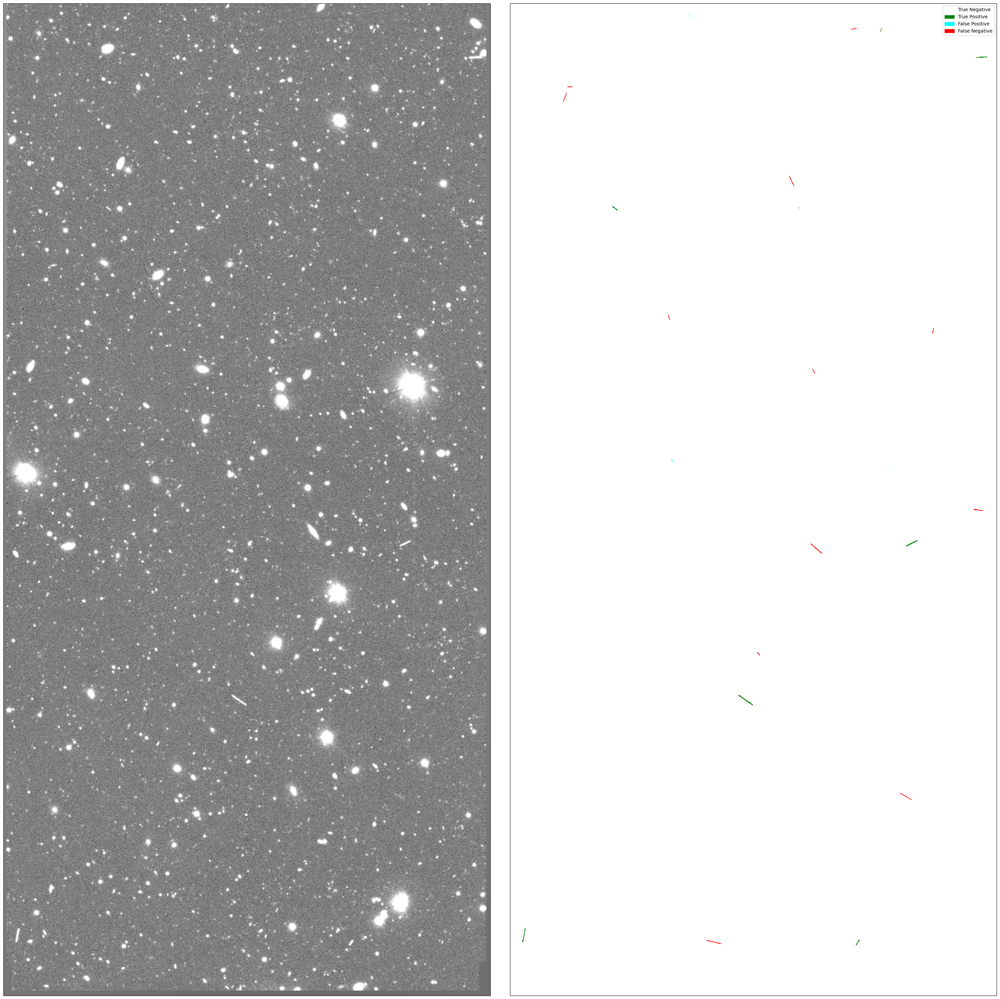

In [9]:
fig, ax = plt.subplots(1,2, figsize=(30,30))
fig.tight_layout()
ax[1] = plot_mask_on_axis (mask, ax[1])
ax[0] = plot_input_on_axis (inputs[0], ax[0])